In [1]:
!which python

/efs/players/to122838/projects/yolov8lard/.venv/bin/python


In [2]:
from pathlib import Path
import pandas as pd
import cv2
import numpy as np
import math
import os
from tqdm import tqdm
import multiprocessing
from functools import partial
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO
import torch
from typing import Tuple, List, Any

/efs/players/to122838/projects/yolov8lard/.venv/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Configure

In [3]:
# where the final dataset will be stored once downloaded and unzipped.
datasets_dirpath = Path('./datasets/lard').resolve()
display(datasets_dirpath.as_posix())

'/efs/players/to122838/projects/yolov8lard/datasets/lard'

In [4]:
display(Path("tmp").resolve())

PosixPath('/efs/players/to122838/projects/yolov8lard/tmp')

# Download

Dataset is hosted on the DEEL platform: [here](https://share.deel.ai/s/H4iLKRmLkdBWqSt?path=%2Flard%2F1.0.0).

In [5]:
# temporary dirpath
tmp_dirpath = Path("tmp").resolve()
# html root address of dataset storage
html_root = "https://share.deel.ai/s/H4iLKRmLkdBWqSt/download?path=%2Flard%2F1.0.0&files="
# list of zip files to download (train / test datasets) (zipfile, csv entry point relative file path)
train_archives = [
    ("LARD_train_BIRK_LFST.zip", "LARD_train_BIRK_LFST.csv"),
    ("LARD_train_DAAG_DIAP.zip", "LARD_train_DAAG_DIAP.csv"),
    ("LARD_train_KMSY.zip", "LARD_train_KMSY.csv"),
    ("LARD_train_LFMP_LFPO.zip", "LARD_train_LFMP_LFPO.csv"),
    ("LARD_train_LFQQ.zip", "LARD_train_LFQQ.csv"),
    ("LARD_train_LPPT_SRLI.zip", "LARD_train_LPPT_SRLI.csv"),
    ("LARD_train_VABB.zip", "LARD_train_VABB.csv"),
]
valid_archives = [
    ("LARD_test_real.zip", "LARD_test_real_nominal_cases/LARD_test_real_nominal_cases.csv"),
    ("LARD_test_synth.zip", "LARD_test_synth.csv"),
]

Download dataset archive files:

In [53]:
!mkdir -p {tmp_dirpath.as_posix()}
for source_archive, _ in train_archives:
    display(f"Downloading ... {source_archive}")
    %time !wget -nc {"\""+html_root+source_archive+"\""} -O {(tmp_dirpath / source_archive).as_posix()}
for source_archive, _ in valid_archives:
    display(f"Downloading ... {source_archive}")
    %time !wget -nc {"\""+html_root+source_archive+"\""} -O {(tmp_dirpath / source_archive).as_posix()}

'Downloading ... LARD_train_BIRK_LFST.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_BIRK_LFST.zip' already there; not retrieving.
CPU times: user 0 ns, sys: 10.6 ms, total: 10.6 ms
Wall time: 163 ms


'Downloading ... LARD_train_DAAG_DIAP.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_DAAG_DIAP.zip' already there; not retrieving.
CPU times: user 0 ns, sys: 10.8 ms, total: 10.8 ms
Wall time: 164 ms


'Downloading ... LARD_train_KMSY.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_KMSY.zip' already there; not retrieving.
CPU times: user 4.19 ms, sys: 7.67 ms, total: 11.9 ms
Wall time: 164 ms


'Downloading ... LARD_train_LFMP_LFPO.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_LFMP_LFPO.zip' already there; not retrieving.
CPU times: user 4.08 ms, sys: 7.44 ms, total: 11.5 ms
Wall time: 163 ms


'Downloading ... LARD_train_LFQQ.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_LFQQ.zip' already there; not retrieving.
CPU times: user 3.83 ms, sys: 7.35 ms, total: 11.2 ms
Wall time: 163 ms


'Downloading ... LARD_train_LPPT_SRLI.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_LPPT_SRLI.zip' already there; not retrieving.
CPU times: user 4.31 ms, sys: 7.77 ms, total: 12.1 ms
Wall time: 163 ms


'Downloading ... LARD_train_VABB.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_VABB.zip' already there; not retrieving.
CPU times: user 366 µs, sys: 11 ms, total: 11.3 ms
Wall time: 163 ms


'Downloading ... LARD_test_real.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_test_real.zip' already there; not retrieving.
CPU times: user 2.17 ms, sys: 9.31 ms, total: 11.5 ms
Wall time: 163 ms


'Downloading ... LARD_test_synth.zip'

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_test_synth.zip' already there; not retrieving.
CPU times: user 4.22 ms, sys: 7.7 ms, total: 11.9 ms
Wall time: 164 ms


Unzip dataset archive files:

In [54]:
for source_archive, _ in train_archives:
    display(f"Unzipping ... {source_archive}")
    %time !unzip -q -o ./tmp/{source_archive} -d {tmp_dirpath.as_posix()}
for source_archive, _ in valid_archives:
    display(f"Unzipping ... {source_archive}")
    %time !unzip -q -o ./tmp/{source_archive} -d {tmp_dirpath.as_posix()}

'Unzipping ... LARD_train_BIRK_LFST.zip'

CPU times: user 1.33 s, sys: 288 ms, total: 1.62 s
Wall time: 2min


'Unzipping ... LARD_train_DAAG_DIAP.zip'

CPU times: user 1.27 s, sys: 211 ms, total: 1.48 s
Wall time: 1min 53s


'Unzipping ... LARD_train_KMSY.zip'

CPU times: user 1.59 s, sys: 271 ms, total: 1.86 s
Wall time: 2min 20s


'Unzipping ... LARD_train_LFMP_LFPO.zip'

CPU times: user 1.62 s, sys: 423 ms, total: 2.04 s
Wall time: 2min 32s


'Unzipping ... LARD_train_LFQQ.zip'

CPU times: user 1.49 s, sys: 320 ms, total: 1.81 s
Wall time: 2min 18s


'Unzipping ... LARD_train_LPPT_SRLI.zip'

CPU times: user 1.63 s, sys: 340 ms, total: 1.97 s
Wall time: 2min 31s


'Unzipping ... LARD_train_VABB.zip'

CPU times: user 1.62 s, sys: 396 ms, total: 2.01 s
Wall time: 2min 31s


'Unzipping ... LARD_test_real.zip'

CPU times: user 149 ms, sys: 23.8 ms, total: 173 ms
Wall time: 12.2 s


'Unzipping ... LARD_test_synth.zip'

CPU times: user 2.26 s, sys: 241 ms, total: 2.5 s
Wall time: 3min 7s


# Process

Main processing functions:

In [6]:
def process(dataset: str, new_image_shape: Tuple[int, int], dest_dirpath: Path, sample: Tuple[int, List[Any]]) -> None:
    """Parallel processing function.

    Args:
        dataset (str): Dataset ("train" / "valid").
        new_image_shape (Tuple[int, int]): New image shape after resize.
        dest_dirpath (Path): Where to store processed data.
        sample (Tuple[int, List[Any]]): Index and dataset sample to process.
    """

    index, row = sample

    # get image and read it
    image_filepath = row['images_dirpath'] / row['image'].replace('\\', '/')
    image = np.array(cv2.cvtColor(cv2.imread(image_filepath.as_posix()), cv2.COLOR_BGR2RGB))
    height, width, depth = image.shape
    # crop watermark
    watermark_height = row["watermark_height"]
    if not math.isnan(watermark_height):
        watermark_height = int(watermark_height)
        image = image[watermark_height:-watermark_height, :, :]
    # resize image and save it
    for task in ["detect", "segment"]:
        new_image_filepath = dest_dirpath / task / 'images' / dataset / f"{index:06d}.jpg"
        image = cv2.resize(image, new_image_shape, interpolation = cv2.INTER_NEAREST)
        os.makedirs(new_image_filepath.parent, exist_ok=True)
        cv2.imwrite(new_image_filepath.as_posix(), cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    # process labels (cx, cy, w, h) normalized
    x = np.array([row[f"x_{k}"] for k in "ABDC"], dtype=np.float32)
    y = np.array([row[f"y_{k}"] for k in "ABDC"], dtype=np.float32)
    # x = np.array([row[f"x_{k}"] for k in "ABDCA"], dtype=np.float32)
    # y = np.array([row[f"y_{k}"] for k in "ABDCA"], dtype=np.float32)
    watermark_height = row["watermark_height"]
    if not math.isnan(watermark_height):
        y -= watermark_height
        height -= 2 * watermark_height
    x = np.clip(x, 0.0, width) / width * new_image_shape[0]
    y = np.clip(y, 0.0, height) / height * new_image_shape[1]

    # bbox
    x_min = float(x.min())
    x_max = float(x.max())
    y_min = float(y.min())
    y_max = float(y.max())
    w = x_max - x_min
    h = y_max - y_min
    cx = x_min + w/2.0
    cy = y_min + h/2.0
    bbox = [cx, cy, w, h]
    bbox[0] /= new_image_shape[0]
    bbox[1] /= new_image_shape[1]
    bbox[2] /= new_image_shape[0]
    bbox[3] /= new_image_shape[1]

    # save labels
    label_filepath = dest_dirpath / "detect" / "labels" / dataset / f"{new_image_filepath.stem}.txt"
    os.makedirs(label_filepath.parent, exist_ok=True)
    with open(label_filepath.as_posix(), 'w') as f:
        f.write('%g %.6f %.6f %.6f %.6f\n' % (0, *bbox))

    # segmentation
    keypoints = (np.stack((x, y), axis=-1) / np.array(new_image_shape)).reshape(-1).tolist()
    label_filepath = dest_dirpath / "segment" / "labels" / dataset / f"{new_image_filepath.stem}.txt"
    os.makedirs(label_filepath.parent, exist_ok=True)
    with open(label_filepath.as_posix(), 'w') as f:
        f.write("0 "+" ".join(['%.6f' % p for p in keypoints])+"\n")

def start(dataset: str, archives: List[str], raw_dirpath: Path, new_image_shape: Tuple[int, int], dest_dirpath: Path):
    """Start dataset generation

    Args:
        dataset (str): Dataset to be processed ("train" / "valid").
        archives (List[str]): List of archives file names.
        raw_dirpath (Path): Directory path where the archives had been unzipped.
        new_image_shape (Tuple[int, int]): Resized image shape.
        dest_dirpath (Path): Directory path where the final dataset will be hosted.
        num_threads (os.cpu_count): Number of threads for parallel processing.
    """
    # get csv filepaths in unzipped archives
    csv_filepaths = [raw_dirpath / archive.rpartition('.')[0] / csv_relfilepath for archive, csv_relfilepath in archives]
    # read csv and concat them
    dfs = []
    for csv_filepath in csv_filepaths:
        # read csv file
        dfi = pd.read_csv(csv_filepath.as_posix(), delimiter=';')
        # append dirpath where images are stored for this chunk
        dfi["images_dirpath"] = csv_filepath.parent
        dfs.append(dfi)
    df = pd.concat(dfs).reset_index(drop=True)
    # start parallel processing
    with multiprocessing.Pool(os.cpu_count()) as pool:
        list(pool.imap(partial(process, dataset, new_image_shape, dest_dirpath), tqdm(df.iterrows())))

def run(dataset_name: str, new_image_shape: Tuple[int, int]) -> Path:
    """Run dataset generation.

    Args:
        dataset_name (str): Name of the generated dataset.
        new_image_shape (Tuple[int, int]): Resized image shape.

    Returns:
        Path: Directory path to generated dataset.
    """
    dest_dirpath = datasets_dirpath / dataset_name
    os.makedirs(dest_dirpath.as_posix(), exist_ok=True)

    display("Process train dataset ...")
    start("train", train_archives, tmp_dirpath, new_image_shape, dest_dirpath)

    display("Process valid dataset ...")
    start("valid", valid_archives, tmp_dirpath, new_image_shape, dest_dirpath)

    display("Create dataset file ...")
    for task in ["detect", "segment"]:
        d = {'path': (dest_dirpath / task).as_posix(),
            'train': "images/train",
            'val': "images/valid",
            'test': "",
            'nc': 1,
            'names': ["runway"]}  # dictionary
        with open((dest_dirpath / task / "dataset.yaml").as_posix(), 'w') as f:
            yaml.dump(d, f, sort_keys=False)

    return dest_dirpath

Drawing function to check a generated sample:

In [7]:
def draw_detect(label_filepath: Path, figsize, dpi):
    sample = pd.read_csv(label_filepath.as_posix(), delimiter=" ", header=None)
    bbox = sample.iloc[0].to_numpy()[1:]

    image_filepath = label_filepath.parent.parent.parent / "images" / label_filepath.parent.stem / f"{label_filepath.stem}.jpg"
    image = np.array(cv2.cvtColor(cv2.imread(image_filepath.as_posix()), cv2.COLOR_BGR2RGB))
    height, width, depth = image.shape
    bbox[0] *= width
    bbox[1] *= height
    bbox[2] *= width
    bbox[3] *= height
    bbox_xyxy = [
        bbox[0] - bbox[2] / 2.,
        bbox[1] - bbox[3] / 2.,
        bbox[0] + bbox[2] / 2.,
        bbox[1] + bbox[3] / 2.,
    ]
    image = cv2.rectangle(image, (int(bbox_xyxy[0]), int(bbox_xyxy[1])), (int(bbox_xyxy[2]), int(bbox_xyxy[3])), color=(255, 0, 0), thickness=3)

    fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
    ax.imshow(image)
    ax.axis("off")

def draw_segment(label_filepath: Path, figsize, dpi):
    sample = pd.read_csv(label_filepath.as_posix(), delimiter=" ", header=None)
    keypoints = sample.iloc[0].to_numpy()[1:].reshape(-1, 2)

    image_filepath = label_filepath.parent.parent.parent / "images" / label_filepath.parent.stem / f"{label_filepath.stem}.jpg"
    image = np.array(cv2.cvtColor(cv2.imread(image_filepath.as_posix()), cv2.COLOR_BGR2RGB))
    height, width, depth = image.shape
    keypoints = keypoints * np.array([width, height])
    image_masked = image.copy()
    image_masked = cv2.fillPoly(image_masked, pts = np.int32(keypoints[np.newaxis,:]), color=(255, 0, 0))
    cv2.addWeighted(image, 0.6, image_masked, 0.4, 0, image_masked)

    fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
    ax.imshow(image_masked)
    ax.axis("off")

Generation entry point:

In [8]:
def build(dataset_name: str, resolution: Tuple[int, int]):
    """Build dataset.

    Args:
        dataset_name (str): Name of the generated dataset
        resolution (Tuple[int, int]): New image resolution (W x H)
    """
    dest_dirpath = run(dataset_name, resolution)
    draw_detect(dest_dirpath / "detect" / "labels/train/000000.txt", figsize=(resolution[0]/200, resolution[1]/200), dpi=200)
    draw_segment(dest_dirpath / "segment" / "labels/train/000000.txt", figsize=(resolution[0]/200, resolution[1]/200), dpi=200)

## DIV0

Generate a dataset with original image size.

'Process train dataset ...'

12675it [02:23, 88.09it/s] 


'Process valid dataset ...'

2276it [00:22, 100.49it/s]


'Create dataset file ...'

CPU times: user 13.2 s, sys: 11.8 s, total: 25 s
Wall time: 2min 53s


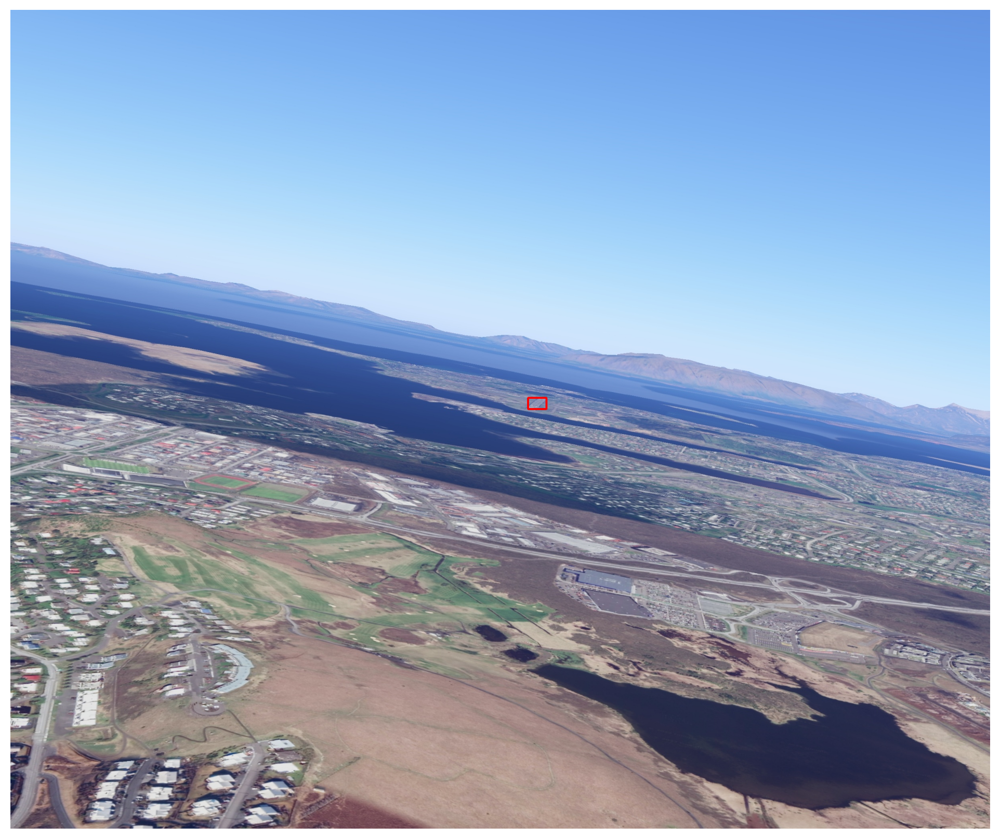

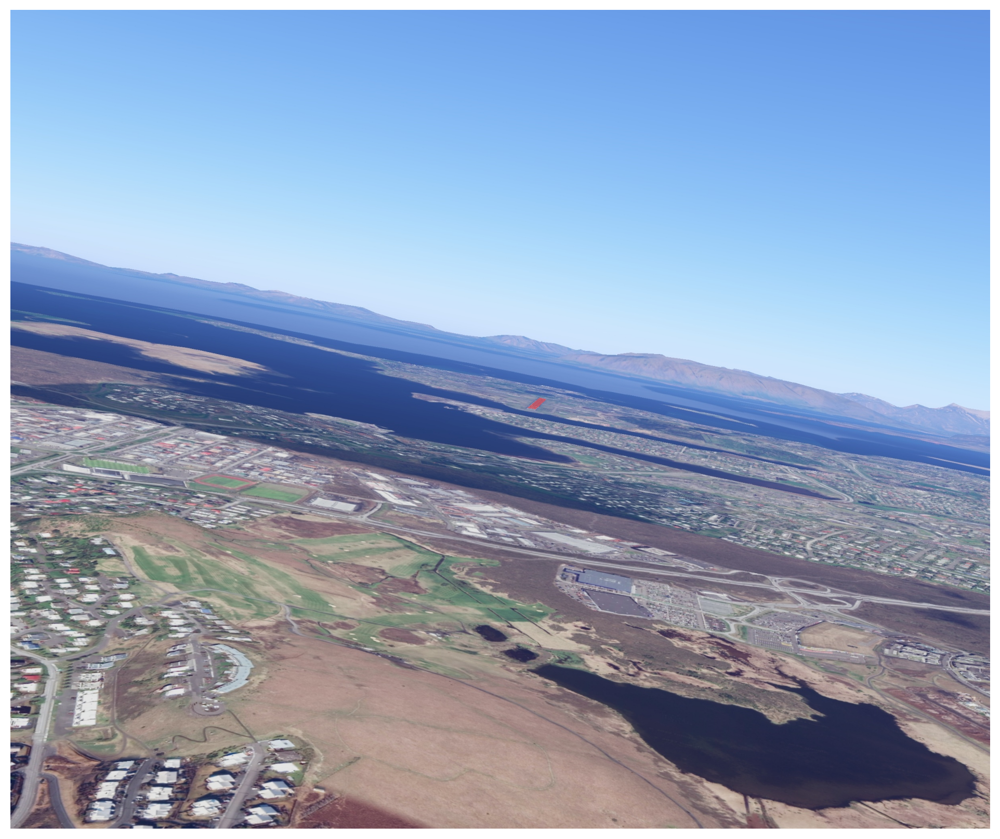

In [27]:
%%time
build("div0", (2448, 2048))

## DIV1

'Process train dataset ...'

12675it [01:35, 133.31it/s]


'Process valid dataset ...'

2276it [00:19, 119.32it/s]


'Create dataset file ...'

CPU times: user 12.4 s, sys: 12.1 s, total: 24.5 s
Wall time: 2min 1s


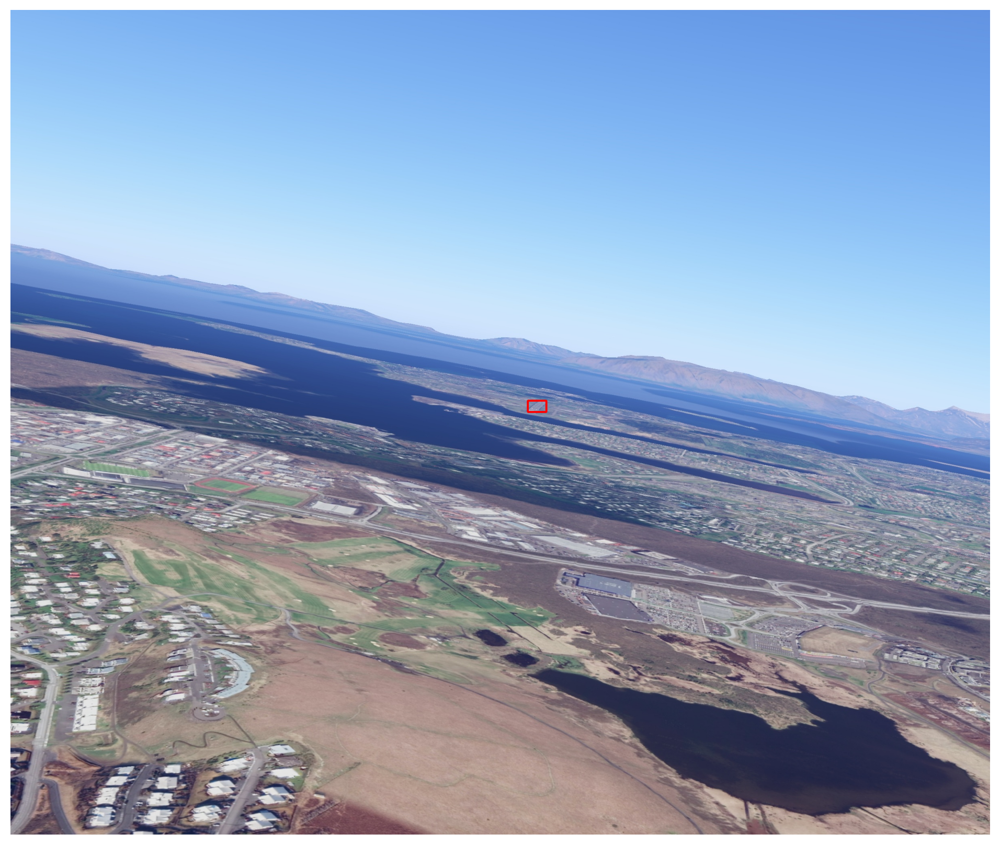

In [48]:
%%time
build("div1", (2432, 2048))

## DIV2

'Process train dataset ...'

12675it [01:19, 158.96it/s]


'Process valid dataset ...'

2276it [00:13, 171.38it/s]


'Create dataset file ...'

CPU times: user 12 s, sys: 13 s, total: 25 s
Wall time: 1min 39s


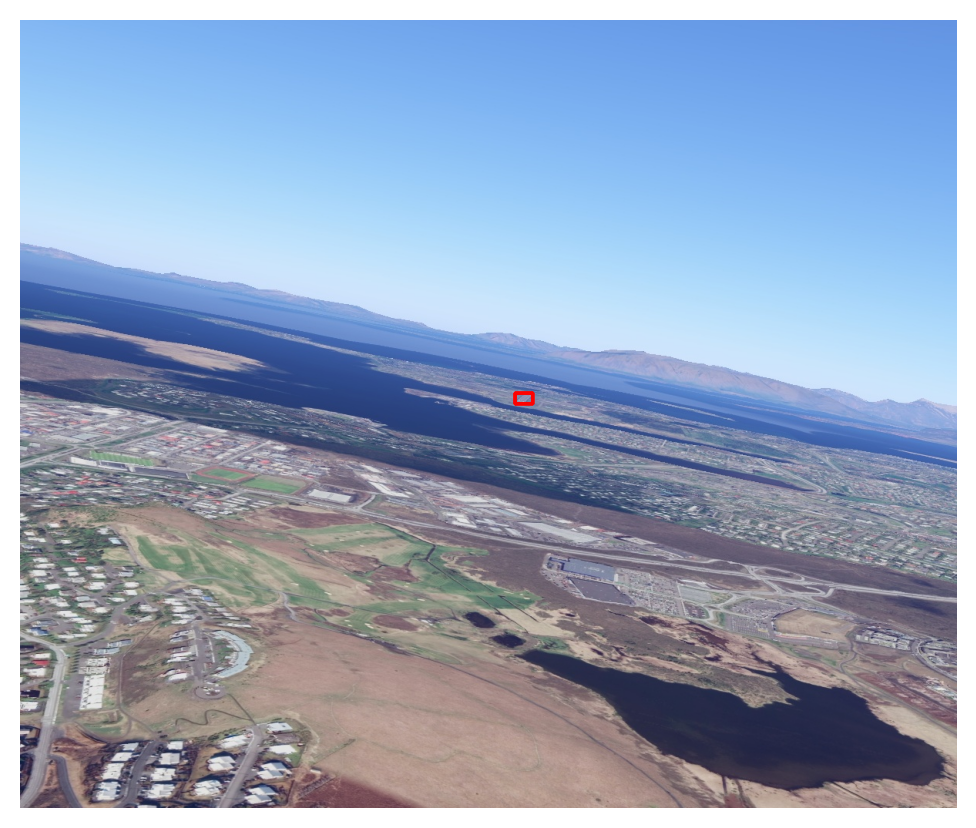

In [49]:
%%time
build("div2", (1216, 1024))

## DIV4

'Process train dataset ...'

12675it [01:25, 148.14it/s]


'Process valid dataset ...'

2276it [00:14, 154.80it/s]


'Create dataset file ...'

CPU times: user 11.6 s, sys: 12.9 s, total: 24.6 s
Wall time: 1min 46s


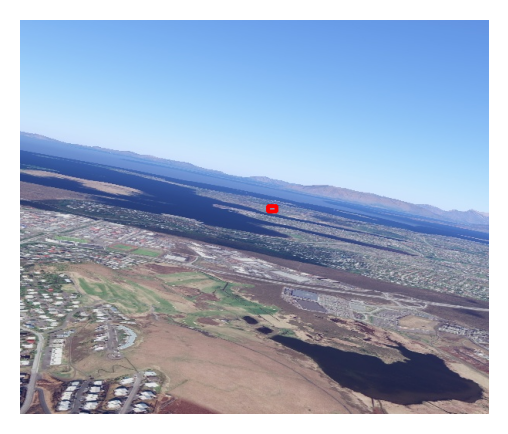

In [50]:
%%time
build("div4", (608, 512))

# Train

In [9]:
def train(dataset, task, model, imgsz=2048, batch_size=16, epochs=20):
    data = (datasets_dirpath / dataset / task / "dataset.yaml").as_posix()
    devices = ','.join([str(i) for i in range(torch.cuda.device_count())])
    bs = torch.cuda.device_count() * batch_size
    !yolo {task} train \
        data={data} \
        model={model} \
        epochs={epochs} \
        imgsz={imgsz} \
        batch={bs} \
        device={devices} \
        optimizer=AdamW \
        lr0=0.001 \
        cos_lr=True

## DIV0

### Segment

#### From pretrained

In [ ]:
# From pretrained
train("div0new", "segment", "yolov8n-seg.pt", batch_size=12)

**Copy paste the run directory (ie `./runs/detect/train`) as `./results/lard/div0/segment/yolov8n/pretrained`.**

Export in ONNX:

In [9]:
model = YOLO('./results/lard/div0/segment/yolov8n/pretrained/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


layer                                     name  gradient   parameters                shape         mu      sigma
    0                      model.0.conv.weight     False          432        [16, 3, 3, 3]    -0.0567       5.29
    1                        model.0.conv.bias     False           16                 [16]   0.000776       5.53
    2                      model.1.conv.weight     False         4608       [32, 16, 3, 3]   -0.00425      0.469
    3                        model.1.conv.bias     False           32                 [32]       0.76       4.81
    4                  model.2.cv1.conv.weight     False         1024       [32, 32, 1, 1]    -0.0194      0.144
    5                    model.2.cv1.conv.bias     False           32                 [32]       1.91       1.31
    6                  model.2.cv2.conv.weight     False         1536       [32, 48, 1, 1]    -0.0111      0.119
    7                    model.2.cv2.conv.bias     False           32                 [32]      

YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs
Ultralytics YOLOv8.0.31 🚀 Python-3.10.9 torch-1.13.1+cu117 CPU

PyTorch: starting from results/lard/div0/segment/yolov8n/pretrained/weights/best.pt with input shape (1, 3, 2048, 2048) and output shape <generator object Exporter.__call__.<locals>.<genexpr> at 0x7fb6baf882e0> (6.8 MB)

ONNX: starting export with onnx 1.13.0...
ONNX: export success ✅ 494.6s, saved as results/lard/div0/segment/yolov8n/pretrained/weights/best.onnx (14.1 MB)

Export complete (1102.3s)
Results saved to /efs/players/to122838/projects/yolov8lard/results/lard/div0/segment/yolov8n/pretrained/weights
Predict:         yolo task=segment mode=predict model=results/lard/div0/segment/yolov8n/pretrained/weights/best.onnx -WARNING ⚠️ not yet supported for YOLOv8 exported models
Validate:        yolo task=segment mode=val model=results/lard/div0/segment/yolov8n/pretrained/weights/best.onnx -WARNING ⚠️ not yet supported for YOLOv8 exporte

#### From scratch

In [1]:
# From p
train("div0new", "segment", "yolov8n-seg.yaml", batch_size=12)

NameError: name 'train' is not defined

**Copy paste the run directory (ie `./runs/detect/train`) as `./results/lard/div0/segment/yolov8n/pretrained`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/detect/yolov8n/pretrained/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

### Detect

#### From pretrained

In [ ]:
# From pretrained
train("div0", "detect", "yolov8n.pt")

**Copy paste the run directory (ie `./runs/detect/train`) as `./results/lard/div0/detect/yolov8n/pretrained`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/detect/yolov8n/pretrained/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

#### From scratch

In [ ]:
# From scratch
train("div0", "detect", "yolov8n.yaml", epochs=100)

**Copy paste the run directory (ie `./runs/detect/train`) as `./results/lard/div0/detect/yolov8n/scratch`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/detect/yolov8n/scratch/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")